# Image Captioning for Documents Using a VLM

In [ ]:
import dotenv

dotenv.load_dotenv("../rag_pipeline/.env")
import os

from openai import AzureOpenAI
import PIL.Image

### Image to URL Converter provided by Microsoft tutorials
Linked at https://learn.microsoft.com/en-us/azure/ai-foundry/openai/how-to/gpt-with-vision?tabs=rest

In [2]:
import base64
from mimetypes import guess_type

# Function to encode a local image into data URL 
def local_image_to_data_url(image_path):
    # Guess the MIME type of the image based on the file extension
    mime_type, _ = guess_type(image_path)
    if mime_type is None:
        mime_type = 'application/octet-stream'  # Default MIME type if none is found

    # Read and encode the image file
    with open(image_path, "rb") as image_file:
        base64_encoded_data = base64.b64encode(image_file.read()).decode('utf-8')

    # Construct the data URL
    return f"data:{mime_type};base64,{base64_encoded_data}"

### Sets up the LLM / VLM with a well-structured API

In [3]:
class LLM():
    """
    This class provides an API to obtain LLM outputs.
    """

    def __init__(self):
        """
        Sets up an instance of the LLM class by configuring the LLM client.
        """
        api_key = os.getenv("OPENAI_API_KEY")

        self.openai_client = AzureOpenAI(
            api_key=api_key,
            api_version="2024-06-01",
            azure_endpoint="https://hkust.azure-api.net",
            azure_deployment="gpt-4o-mini",
        )

    
    def _get_sys_prompt(self) -> str:
        """
        Provides an easy way to obtain the system prompt using methods in this class.

        returns:
        - a string containing the system prompt to use the LLM as a palmistry expert.
        """
        system_prompt = """You are an image captioner. 
You will be provided with an image as well as some text in the original source.

Your task is to produce a caption for the image with context from the original source.
Describe what you see in the image, and give a comprehensive caption that explains the image content as well as the context of the document.
However, do not give information that is too excessive in the caption. 
Remain factual in writing the caption.

Provide the caption with the following information.
        """
        return system_prompt


    def get_LLM_output(
            self, 
            user_prompt: str, 
            system_prompt: str = None,
            image_data: str = None
        ) -> str:
        """
        Gets output from an LLM.

        args:
        - user_prompt (str): user query towards the LLM
        - system_prompt (str): system prompt that provides context and instructions to the LLM
        - image_data (str): image URL after being encoded

        returns:
        - a string that contains the LLM's output
        """
        sys_prompt = system_prompt if system_prompt else self._get_sys_prompt()
        
        messages = [
            {"role": "system", "content": sys_prompt}
        ]

        if image_data:
            user_message = [
                {
                    "type": "text",
                    "text": user_prompt
                },
                {
                    "type": "image_url",
                    "image_url": {"url": image_data}
                }
            ]
        else:
            user_message = user_prompt

        messages.append({"role": "user", "content": user_message})

        output = self.openai_client.chat.completions.create(
            model="gpt-4o-mini",
            messages=messages,
        )

        return output.choices[0].message.content

### Extracts images found in the source document

In [4]:
%pip install pymupdf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.1/24.1 MB 2.1 MB/s  0:00:11m0:00:0100:01m
Note: you may need to restart the kernel to use updated packages.


In [5]:
import fitz
import os

def extract_images_with_context(pdf_path: str, output_image_dir: str) -> list[dict]:
    """
    Extracts images and their surrounding text context from a PDF document.

    Args:
        pdf_path (str): Path to the source PDF file
        output_image_dir (str): Directory where extracted images will be saved
    """

    os.makedirs(output_image_dir, exist_ok=True)

    doc = fitz.open(pdf_path)

    image_paths_and_contexts = []

    for page_num in range(len(doc)):
        page = doc.load_page(page_num)

        # all text blocks from the current page (including coordinates)
        text_blocks = page.get_text("blocks")
        text_blocks.sort(key=lambda block: block[1])  # sort vertically

        image_list = page.get_images(full=True)

        for img_index, img in enumerate(image_list):
            xref = img[0]
            pix = fitz.Pixmap(doc, xref)

            # coordinates of current image
            img_rect = page.get_image_bbox(img)
            img_x0, img_y0, img_x1, img_y1 = img_rect
            img_width = img_x1 - img_x0
            img_height = img_y1 - img_y0

            # image location and size (for debugging)
            # print(f"Page {page_num+1}, Image {img_index+1}:")
            # print(f"  Location: ({img_x0:.2f}, {img_y0:.2f})")
            # print(f"  Size: {img_width:.2f} x {img_height:.2f}")

            image_filename = f"page_{page_num+1}_img_{img_index+1}.png"
            image_path = os.path.join(output_image_dir, image_filename)
            pix.save(image_path)    # saves image to file system

            context_blocks = []
            for block in text_blocks:
                block_rect = fitz.Rect(block[:4])
                block_text = block[4].strip()

                # text close to image is used as context
                if (abs(block_rect.y1 - img_y0) < 50 or abs(block_rect.y0 - img_y1) < 50):
                    context_blocks.append(block_text)

            context_text = " ".join(context_blocks)

            image_paths_and_contexts.append({
                "context": context_text,
                "image_path": image_path
            })

            pix = None

    doc.close()

    return image_paths_and_contexts

# Example use

### Example Document: 5.1_ Approximating Areas - Mathematics LibreTexts.pdf ###


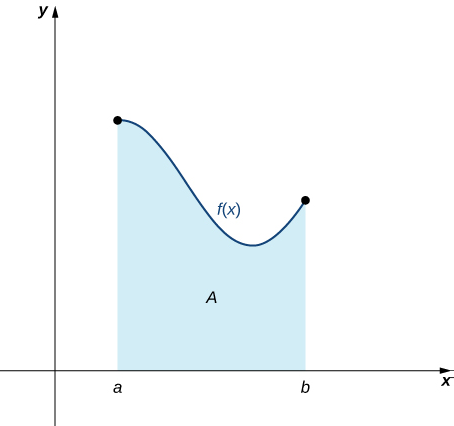

Caption: The image illustrates the concept of approximating the area under a curve defined by the function \( f(x) \). The shaded region, labeled \( A \), represents the area we aim to evaluate, bounded above by the curve \( f(x) \), below by the x-axis, and between the vertical lines \( x = a \) and \( x = b \). This geometric approach involves dividing the region into smaller shapes with known area formulas to sum their areas for an estimate of the total area under the curve.
Time used: 3.027536392211914


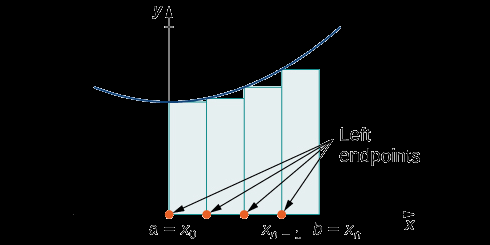

Caption: This image illustrates the left-endpoint approximation method for estimating the area under a curve. It features a graph with a continuous curve, where the area is approximated using rectangles. The heights of these rectangles are determined by evaluating the function at the left endpoints of each subinterval, represented by points along the x-axis. The text "Left endpoints" labels this method, highlighting that the rectangles are constructed based on function values at the left side of each subinterval. This visual aids in understanding how this method differs from the right-endpoint approximation described in the source document.
Time used: 2.2356269359588623


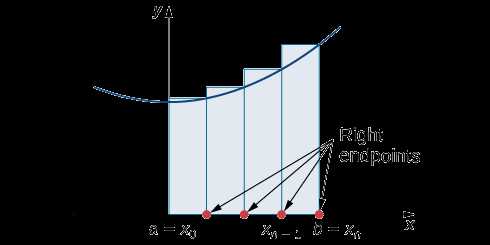

Caption: The image depicts a right-endpoint approximation method for estimating the area under a curve. It illustrates the curve defined by the function \( f(x) \) along with six subintervals represented by vertical rectangles. The heights of these rectangles are determined by evaluating the function at the right endpoints of each subinterval. The graphic includes markers at the right endpoints labeled \( x_1, x_2, \ldots, x_n \), while also indicating the interval boundaries \( a \) and \( b \). This visual representation highlights how the area under the curve is approximated by summing the areas of the rectangles formed, distinct from a left-endpoint approximation where heights would be calculated at the left endpoints of each subinterval.
Time used: 4.829908132553101


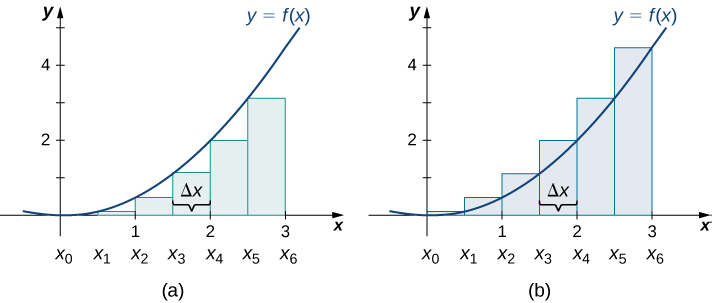

Caption: Caption: This image illustrates two methods for approximating the area under a curve represented by the function \( y = f(x) \). Panel (a) depicts the left-endpoint approximation where vertical lines are drawn at the left endpoints of each subinterval \( [x_i, x_{i+1}] \), resulting in rectangular areas that sum to estimate the area under the curve. Panel (b) shows the right-endpoint approximation, where vertical lines are drawn at the right endpoints of each subinterval, allowing for a different estimation of the area by calculating the areas of rectangles formed on the right side. Each rectangle's width is denoted by \( \Delta x \), highlighting the method of subdividing the interval to compute the area.
Time used: 5.017620086669922


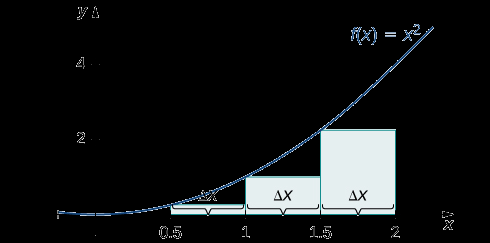

Caption: The graph illustrates the left-endpoint approximation for calculating the area under the curve of the function \( f(x) = x^2 \) from \( x = 0 \) to \( x = 2 \). It displays the rectangles formed using the left endpoints of each interval, denoted by the width \( \Delta x \). This method visually represents how the area is approximated using these rectangles. The accompanying context indicates that a similar right-endpoint approximation is examined in a different figure.
Time used: 3.6959340572357178


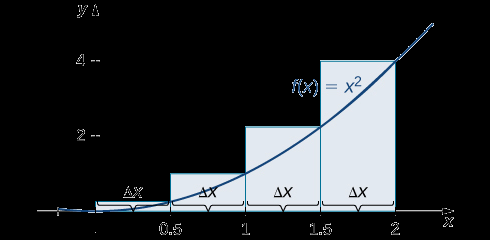

Caption: The image depicts a graph illustrating the right-endpoint approximation of the area under the curve of the function \( f(x) = x^2 \) from \( x = 0 \) to \( x = 2 \). The shaded rectangles represent the right-endpoint method for estimating the area under the curve, with height determined by the function value at the right endpoint of each interval. The graph highlights the intervals of width \( \Delta x \) and indicates that the right-endpoint approximation yields a specific area value, distinct from the left-endpoint approximation discussed in the context.
Time used: 4.611325025558472


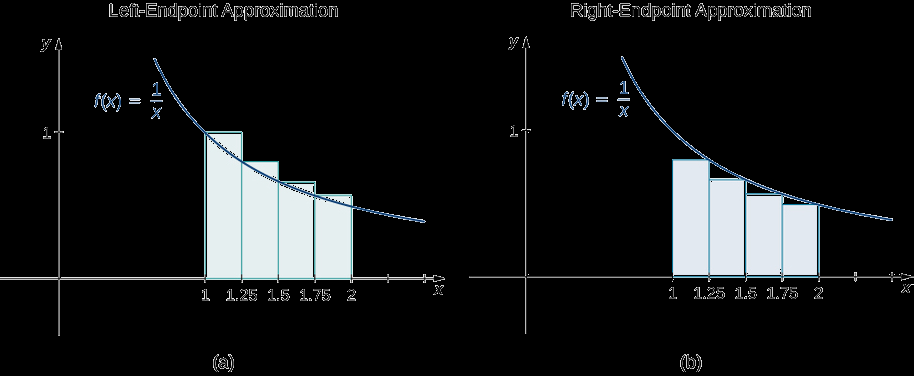

Caption: This image illustrates the left-endpoint approximation (a) and right-endpoint approximation (b) for the function \( f(x) = \frac{1}{x} \) over the interval from 1 to 2. In the left graph, rectangles are constructed using the left endpoints of subintervals to estimate the area under the curve, while in the right graph, rectangles are made using the right endpoints. The provided context explains that with a small number of intervals, both methods yield inaccurate estimates of the area under the curve. However, as the number of intervals increases, the approximations improve due to thinner rectangles that better conform to the curve.
Time used: 10.124019861221313


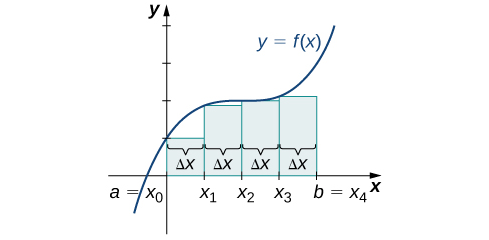

Caption: This image illustrates a left-endpoint approximation for estimating the area under the curve \( y = f(x) \) over the interval from \( a = x_0 \) to \( b = x_4 \). The region is divided into four equal intervals, each represented by a rectangle whose height corresponds to the value of the function at the left endpoint (\( x_0, x_1, x_2, x_3 \)). The rectangles approximate the area under the curve, although some area remains uncovered, depicted as white space under the curve. This technique is a foundational concept in integral calculus, emphasizing how increasing the number of intervals can reduce the white space and improve the approximation of the area under the curve.
Time used: 2.457019329071045


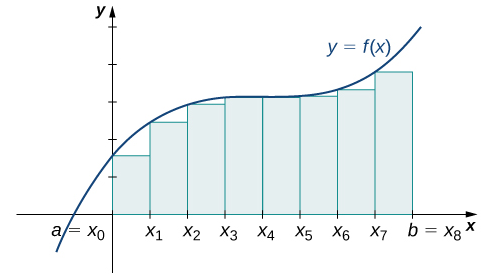

Caption: This image illustrates a curve represented by the function \(y = f(x)\) along with eight rectangles inscribed under the curve. The rectangles are divided into equal widths along the interval from \(a = x_0\) to \(b = x_8\). This left-endpoint approximation technique aims to estimate the area under the curve. Compared to previous illustrations with fewer rectangles, this arrangement shows a reduced amount of white space beneath the curve, indicating a more accurate approximation of the area under the curve. The focus is on the effectiveness of using more rectangles for better area estimation in calculus.
Time used: 2.3092873096466064


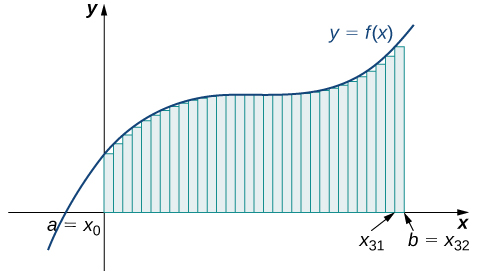

Caption: This image illustrates a left-endpoint approximation of the area under the curve of the function \( y = f(x) \) using inscribed rectangles. The graph shows four vertical rectangles situated beneath the curve, with the left ends of each rectangle aligned at the points \( x_0, x_1, x_2, \) and \( x_3 \) along the x-axis, with the endpoints labeled as \( a = x_0 \) and \( b = x_{32} \). This graphical representation is part of a discussion on different methods for approximating the area under a curve, highlighting the concept of using rectangles to estimate integral values.
Time used: 2.4970309734344482


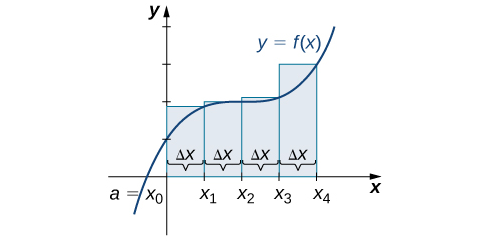

Caption: The image illustrates the right-endpoint approximation method for calculating the area under a curve \( y = f(x) \) over the interval from \( a = x_0 \) to \( x_4 \). The curve is divided into four equal subintervals, represented by rectangles with width \( \Delta x \). Each rectangle's height corresponds to the value of the function at the right endpoint of the respective subinterval. This method is used to estimate the area, demonstrating the concept of using rectangles to approximate integral areas under curves in calculus.
Time used: 4.13848614692688


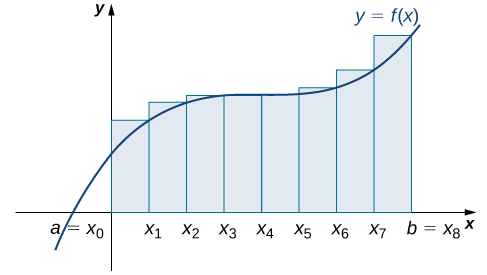

Caption: Caption: This image illustrates the right-endpoint approximation method for estimating the area under the curve \( y = f(x) \) over the interval from \( a = x_0 \) to \( b = x_8 \). The region is divided into eight equal subintervals, with vertical rectangles drawn at the right endpoints \( x_1, x_2, \ldots, x_8 \). This method is used to approximate the actual area and demonstrates how the approximation becomes closer to the true area as the number of subintervals increases.
Time used: 2.7281436920166016


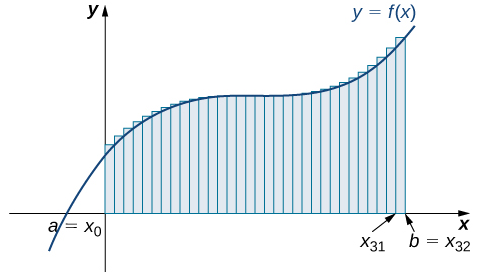

Caption: The image depicts a curve representing the function \( y = f(x) \) along with a series of vertical rectangles used for the right-endpoint approximation of the area under the curve. The interval \([a = x_0, b = x_{32}]\) is divided into equal subintervals, with rectangles extending to the right of each subinterval endpoint at \(x_{31}\) and \(x_{32}\). This visualization supports the discussion on how the right-endpoint approximations improve as the number of intervals increases, leading to a better estimation of the actual area under the curve as indicated in the context of the source document.
Time used: 2.937168836593628


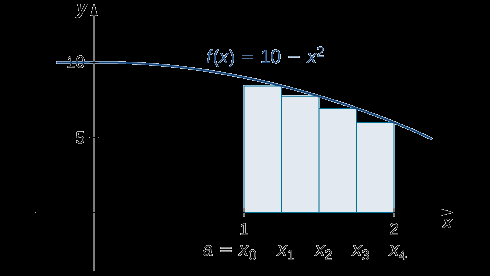

Caption: Caption: This graph illustrates the function \( f(x) = 10 - x^2 \) with a right-endpoint approximation for the area bound by the curve and the x-axis between \( x = 1 \) and \( x = 2 \). The shaded rectangles represent the lower sum corresponding to this Riemann sum, showing how the total area is approximated using four subdivisions. The x-values \( x_0, x_1, x_2, x_3, x_4 \) indicate the endpoints of the intervals used in this approximation.
Time used: 2.702054977416992


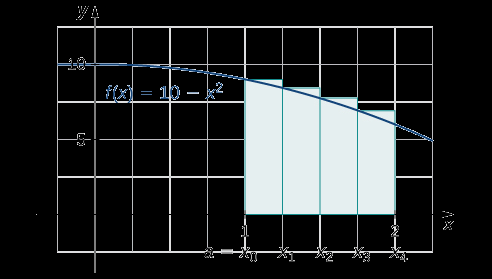

Caption: The image depicts the graph of the function \( f(x) = 10 - x^2 \) over the interval [1, 2]. It illustrates the concept of lower and upper sums in integral calculus. The shaded rectangular areas represent an approximation of the area under the curve, which is used to estimate the integral of the function within the specified interval. This visualization is part of an example discussing the calculation of lower sums for the function in the context of numerical integration.
Time used: 3.7810990810394287


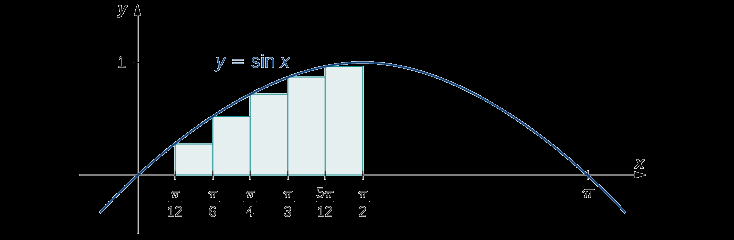

Caption: Caption: This graph illustrates the function \( y = \sin x \) over the interval from 0 to \( \frac{\pi}{2} \). The area under the curve is approximated by dividing it into six regions, represented by the shaded rectangles, which are used to calculate a lower sum for the integral over this interval. The heights of the rectangles correspond to the sine values at specific points along the x-axis, reflecting the approach to estimate the area beneath the curve visually.
Time used: 1.9448885917663574
### Example Document: Apple Intelligence features are now available in traditional Chinese - Apple (HK).pdf ###


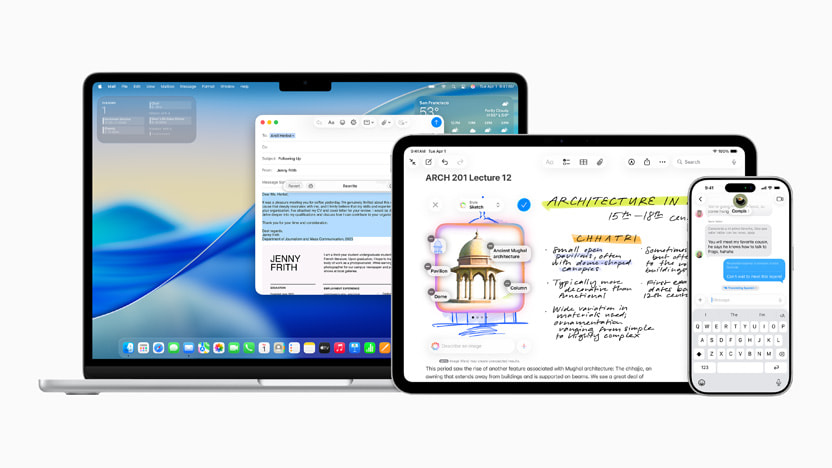

Caption: The image displays a MacBook, iPad, and iPhone, showcasing Apple Intelligence features available in eight new languages, including traditional Chinese. The MacBook screen features a productivity app with an assignment overview, while the iPad displays a lecture note with visual annotations, and the iPhone captures a text message conversation. This integration highlights the versatile AI capabilities like Live Translation and Writing Tools now accessible across Apple's devices, enhancing user experience in educational and communication contexts.
Time used: 3.0959091186523438


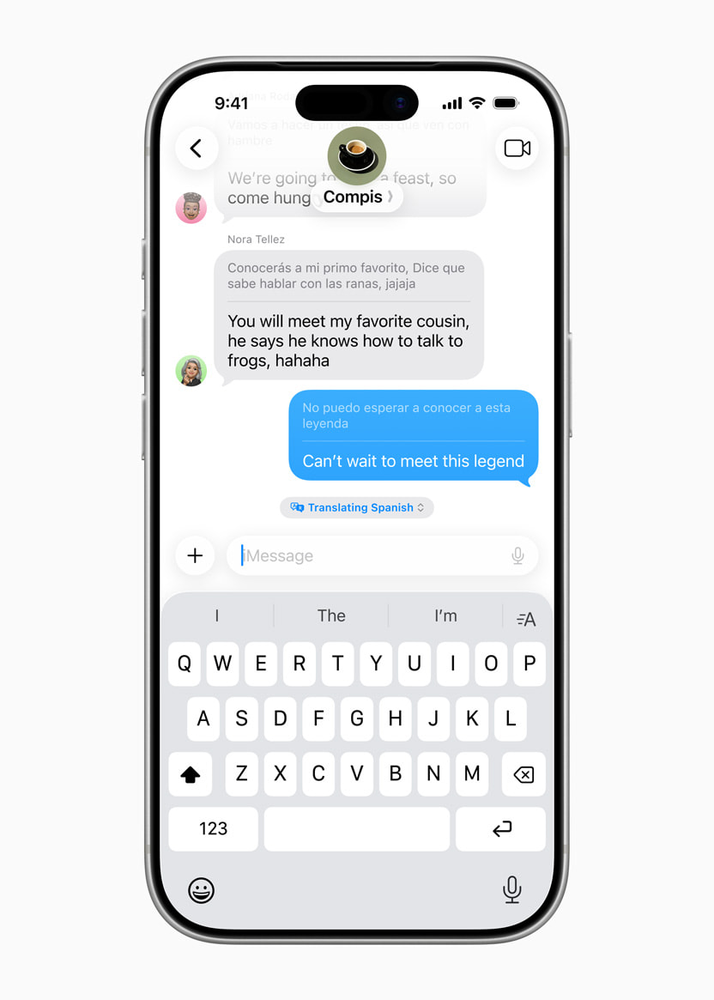

Caption: The image displays a smartphone screen showing a messaging conversation enhanced by Live Translation features. The chat participants are sharing playful messages about meeting a cousin who purportedly can talk to frogs, with translations provided for ease of understanding. In this particular exchange, a message in Spanish translates to "Can’t wait to meet this legend," demonstrating the seamless integration of translation technology within Apple’s messaging services as highlighted in the context, which emphasizes the capability to bridge language barriers while maintaining user privacy through on-device processing.
Time used: 3.6124167442321777


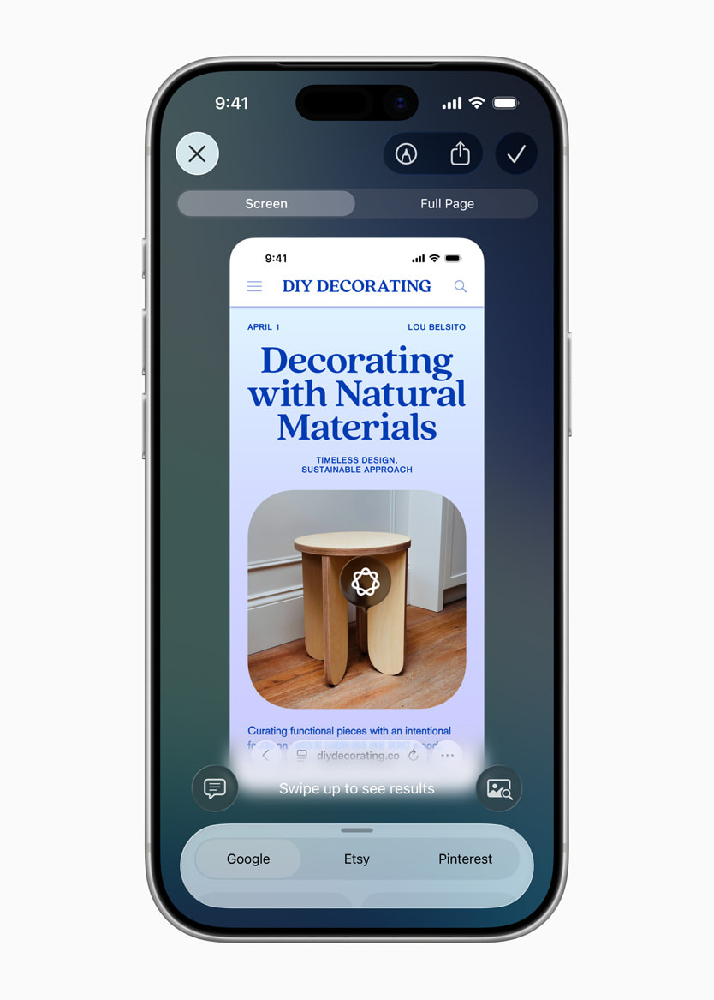

Caption: This image showcases an iPhone displaying a webpage titled "Decorating with Natural Materials," which emphasizes timeless design and sustainable approaches to home décor. The page features an image of a unique wooden table, designed with a circular cut-out, positioned against a backdrop of a wooden floor and wall. The interface includes options for searching related content via Google, Etsy, and Pinterest, highlighting the iPhone’s visual intelligence capabilities that assist users in analyzing objects and enhancing their understanding of visual content.
Time used: 5.823477745056152


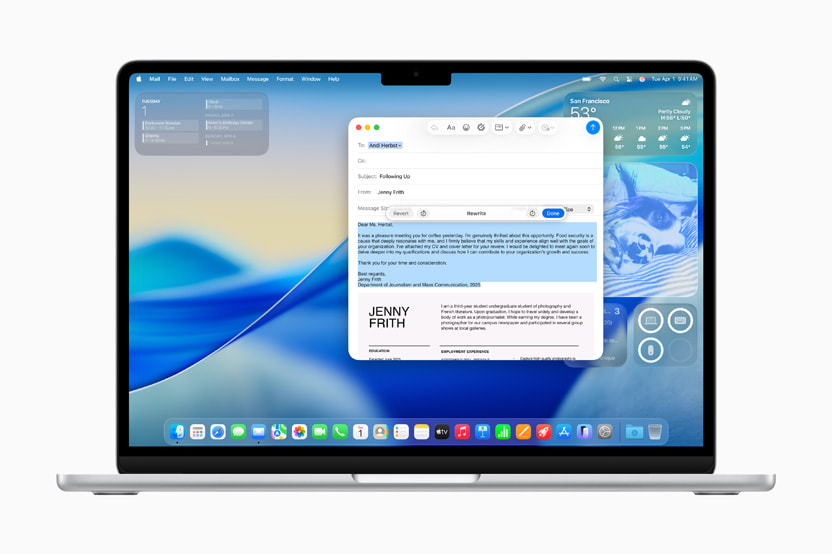

Caption: A user is drafting an email titled "Following Up" on a MacBook, utilizing Writing Tools to improve their text. The Writing Tools feature includes an option to "Rewrite" the message for enhanced clarity and effectiveness. This image illustrates the convenience of refining written communication in various applications, as highlighted in the source document.
Time used: 2.5671324729919434


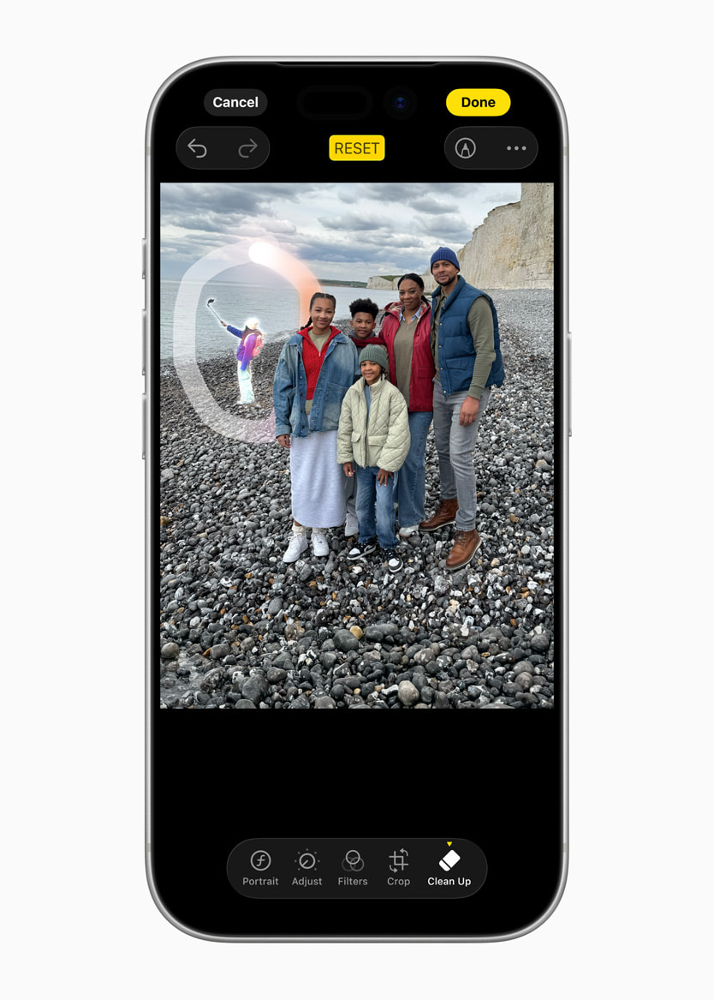

Caption: This image features a group of people posing on a rocky beach, demonstrating the use of a photo editing app called Clean Up. The editing interface is visible on the screen of a smartphone, where options like 'Reset' and 'Done' can be seen. The photo appears to be in the process of being edited to remove distracting elements in the background while retaining the authentic atmosphere of the moment. This showcases the app’s capability to enhance images by focusing on desired subjects.
Time used: 5.227652311325073


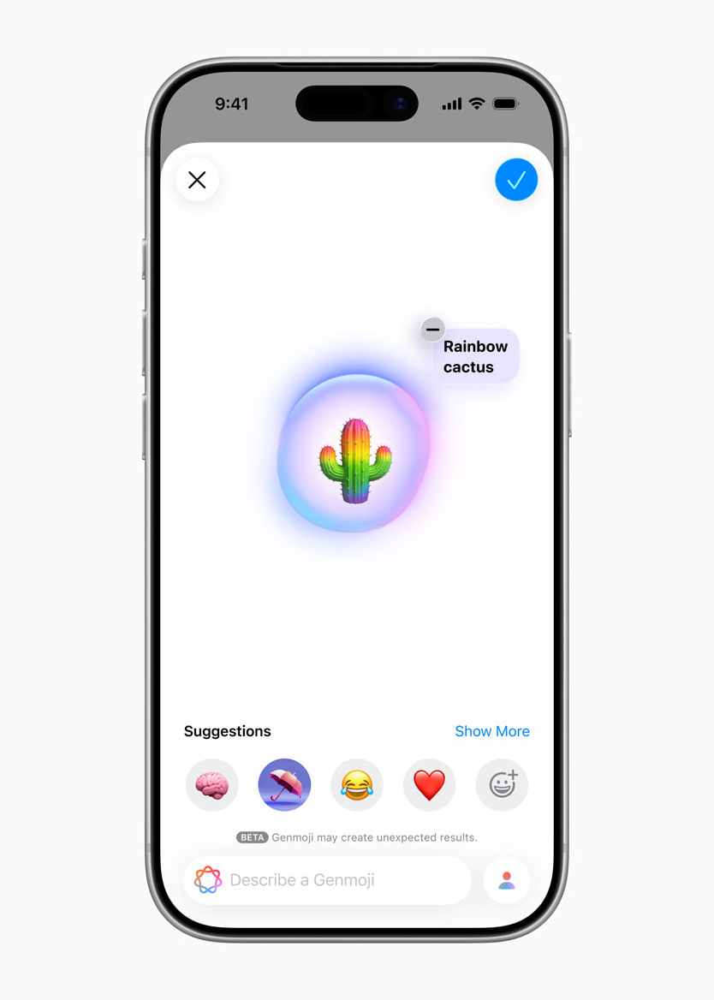

Caption: This image shows a smartphone screen displaying a colorful and playful emoji known as "Rainbow cactus." The emoji is highlighted in a glowing bubble effect, drawing attention to its creative design. Below, the interface offers suggestions for other emojis and the option to "Describe a Genmoji" for users to generate their unique emojis. This feature is part of the Genmoji tool, which allows users to personalize their conversations and make them more fun and expressive, as highlighted in the source context.
Time used: 3.481506824493408


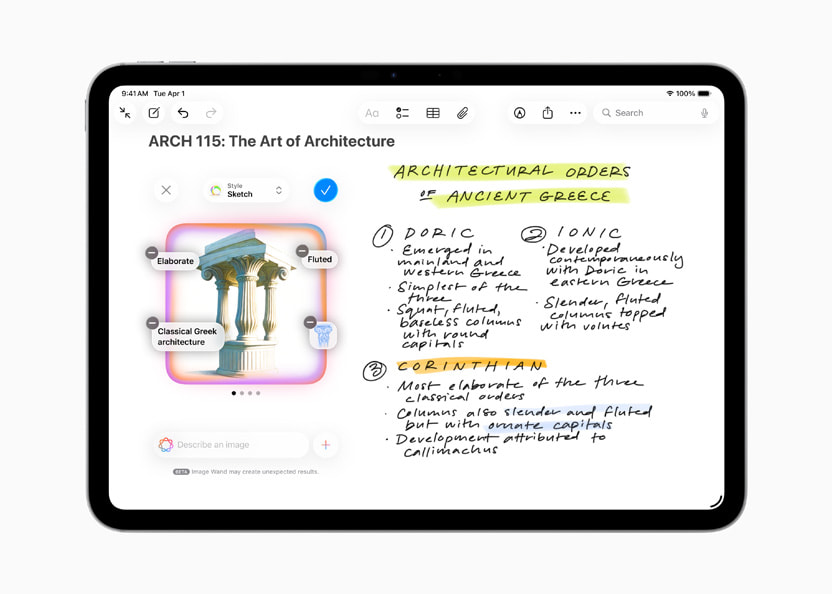

Caption: This image displays a digital note-taking app interface on a tablet, featuring content related to a course titled "ARCH 115: The Art of Architecture." The screen showcases a visual representation of three classical Greek architectural orders: Doric, Ionic, and Corinthian, along with handwritten notes detailing their characteristics. The Image Wand tool, highlighted within the palette, enables users to generate visual elements based on existing notes, demonstrating an integrated approach to learning and visual aid in studying architectural styles of ancient Greece.
Time used: 5.561053514480591


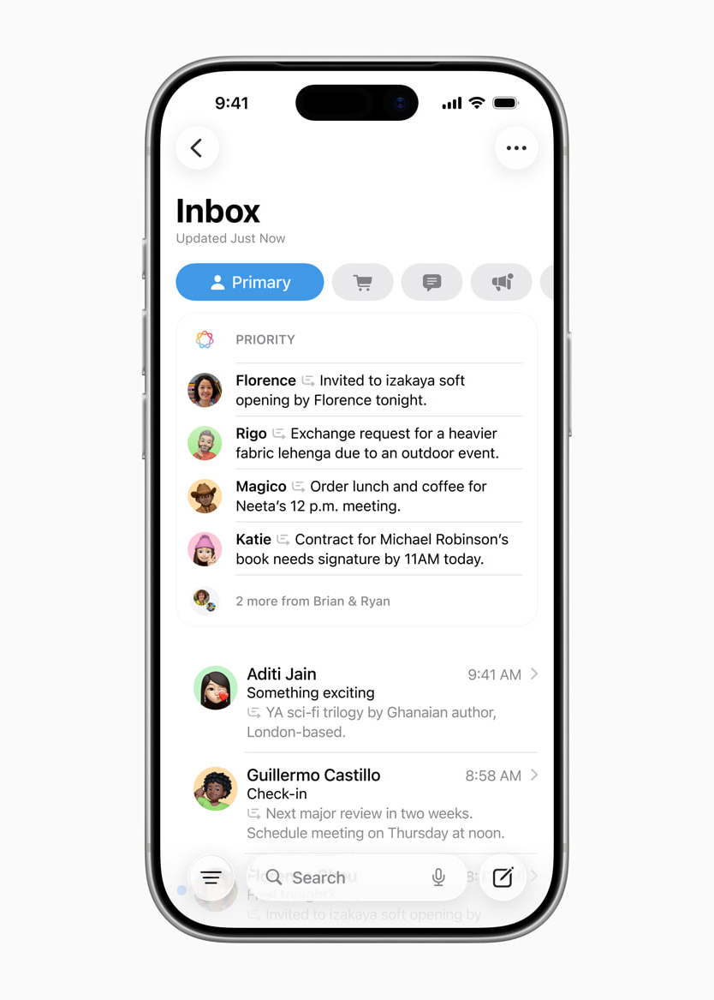

Caption: The image displays a mobile inbox interface featuring a section labeled "PRIORITY" at the top. This section contains several highlighted emails, indicating urgent messages that require the user's attention. Notable entries include an invitation to a soft opening and requests related to upcoming events and signatures. This organizational feature is designed to help users quickly identify and respond to their most important emails, enhancing productivity and communication.
Time used: 3.552072763442993


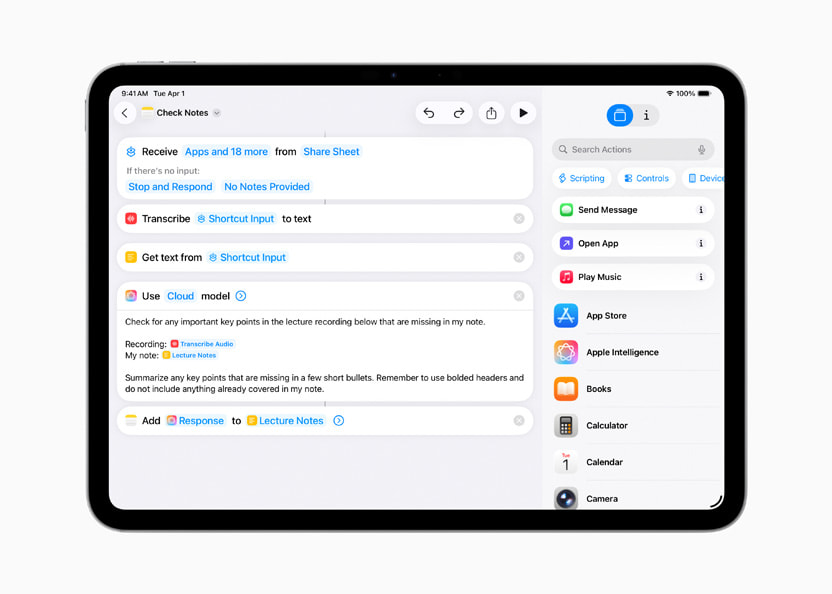

Caption: This image displays the Shortcuts app on an iPad, featuring a workflow designed to optimize note-taking by integrating Apple Intelligence. The visible automation includes actions such as receiving input from share sheets, transcribing recorded audio into text, and extracting key points to enhance note clarity. This setup exemplifies how users can leverage intelligent actions within the Shortcuts app to create efficient automation for organizing lecture notes.
Time used: 2.457926034927368


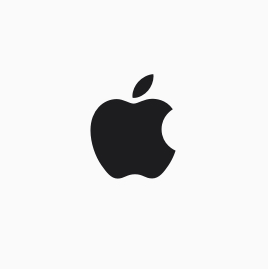

Caption: The iconic black Apple logo featured in the image symbolizes the brand's latest innovations, including the newly released iPad Pro, 14-inch MacBook Pro, and Apple Vision Pro. This image accompanies Apple's fourth quarter results announcement on October 31, 2025, reflecting the company's ongoing commitment to cutting-edge technology and product development.
Time used: 3.6924631595611572


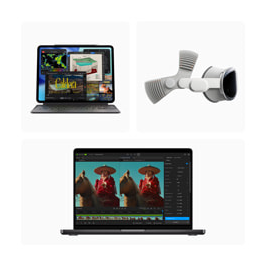

Caption: The image features three products: the new iPad Pro, a 14-inch MacBook Pro, and the Apple Vision Pro headset. The iPad Pro is shown at the top, displaying a colorful multitasking screen, while the Apple Vision Pro is depicted in the top right corner, showcasing its innovative design for immersive experiences. The 14-inch MacBook Pro is featured at the bottom, highlighting a professional photo editing application. All these devices are highlighted in an update announcing their availability on October 22, 2025.
Time used: 2.24674654006958


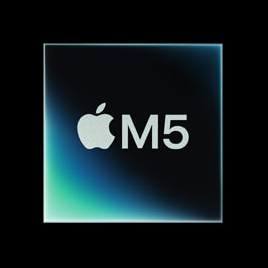

Caption: The image features the sleek design of the Apple M5 chip, prominently displaying the Apple logo alongside the chip model number "M5." This chip represents a significant advancement in AI performance for Apple silicon, as announced in a press release dated 15 October 2025, highlighting Apple's continued innovation in technology.
Time used: 3.890941858291626
### Example Document: Transport Arrangement for Fall Term _ Campus Services Office.pdf ###


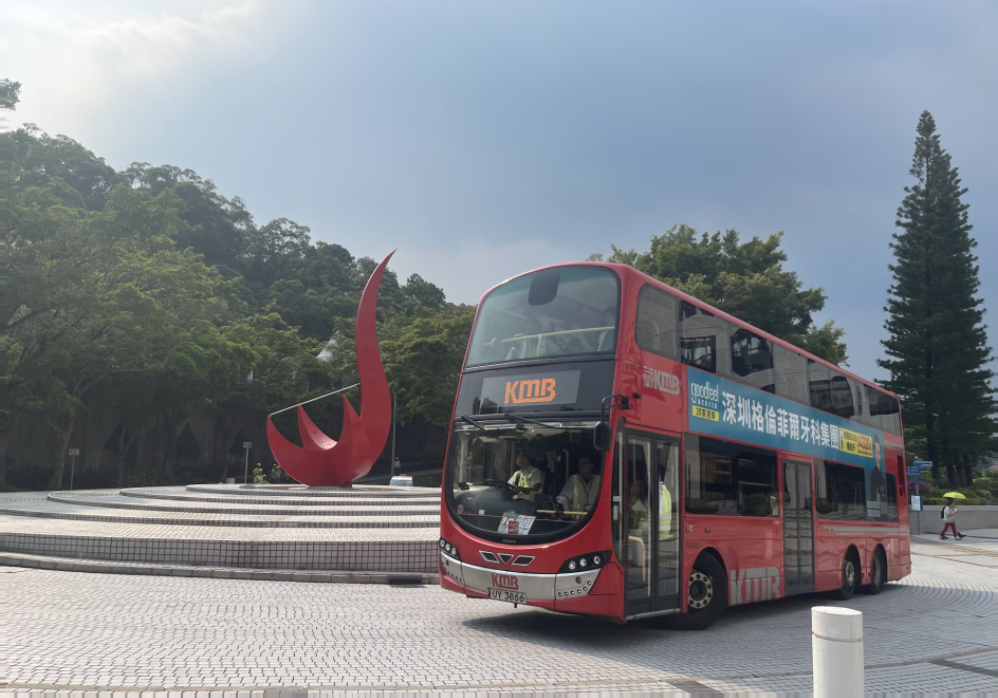

Caption: A KMB double-decker bus number 91B is parked in front of the campus at Hong Kong's Science and Technology University, beside a striking red sculpture. This bus service provides direct non-stop transportation back to the university campus, as highlighted in recent updates about improved bus services, including the introduction of electric buses on the 91B route and additional special trips on route 91P.
Time used: 3.865211248397827


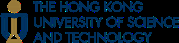

Caption: The logo of The Hong Kong University of Science and Technology, featuring a stylized emblem and the institution's name in blue. This image represents the university's commitment to serving its diverse community, including students, faculty, staff, on-campus residents, and guests, as outlined by the CAMPUS SERVICES OFFICE.
Time used: 3.8527848720550537


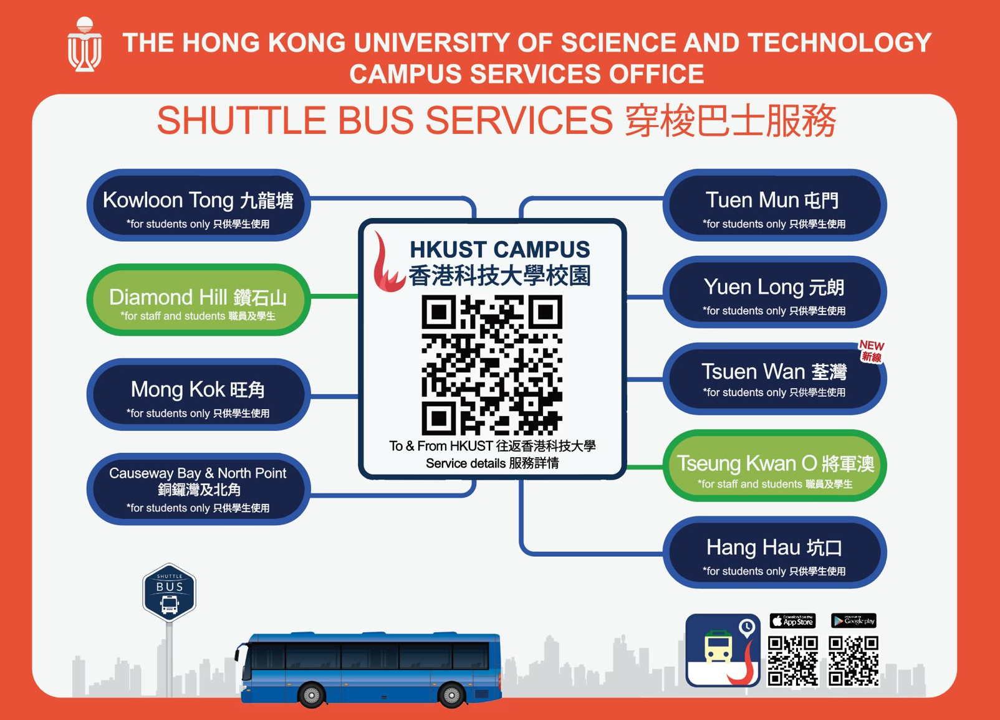

Caption: The image shows a detailed map of the shuttle bus services provided by The Hong Kong University of Science and Technology (HKUST). Various routes are indicated for students and staff, linking the campus to multiple locations including Kowloon Tong, Diamond Hill, Mong Kok, and more. The map features an illustrative blue shuttle bus and a QR code that directs users to further service details. This information is particularly relevant as the autumn semester begins on September 1, following the holiday period, and students, faculty, and staff are advised to adjust their schedules accordingly to manage anticipated traffic congestion.
Time used: 4.957687616348267


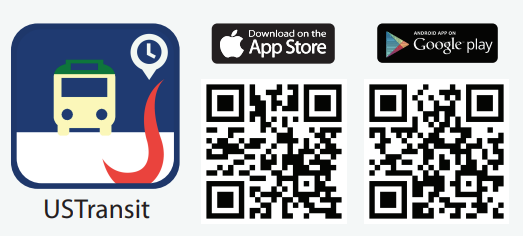

Caption: The image features the logo for the USTransit mobile application, which provides real-time information about shuttle bus arrival times. It includes QR codes for downloading the app from the Apple App Store and Google Play Store. This app, developed by alumni of the institution, allows users to check the status of the campus shuttle services, including new routes such as the Tsuen Wan Line and the free Hung Hom Line, enhancing the transportation experience for students and staff.
Time used: 2.6188912391662598


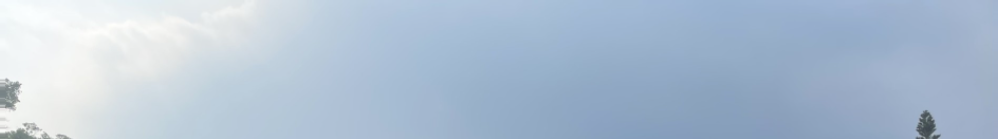

Caption: This image showcases a serene sky with soft clouds, suggesting a calm atmosphere, possibly near the Hang Hau area. Within the context of the source document, it relates to the Hang Hau Express 91B bus service, which includes designated campus drop-off points. This service will now operate with electric buses for the term, highlighting a commitment to eco-friendly transportation options.
Time used: 4.096440315246582


Caption: This image appears to be an icon representing a bus stop or transportation service. It is likely part of a mobile app or informational graphic related to public transport. The context from the source document discusses the availability of minibusses and bus services, especially during busy hours or after classes at the university. It emphasizes the importance of coordinating transport services and using a mobile app developed by alumni to track real-time arrival times of these services, reflecting the institution's initiative to enhance transportation accessibility for students.
Time used: 3.7589597702026367


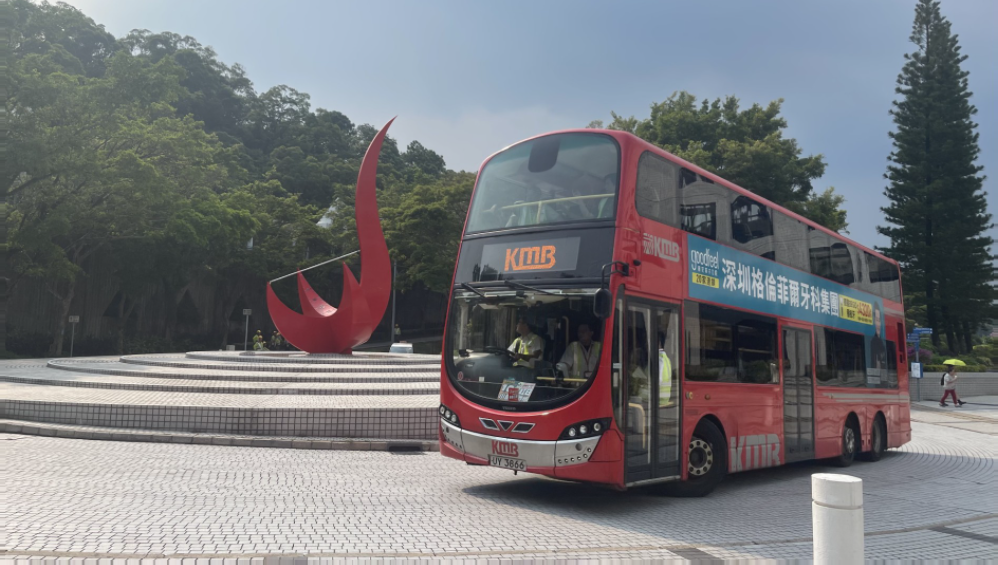

Caption: A red double-decker bus marked 'KMB' is seen at a circular plaza featuring a contemporary red sculpture, surrounded by greenery. This image reflects the resumption of Special Bus 91P services during peak hours, which now includes newly added trips. Additionally, it highlights that the special 291P route to Mongkok has an extra schedule at 18:05, with the only exception being the 17:45 schedule.
Time used: 9.041121482849121


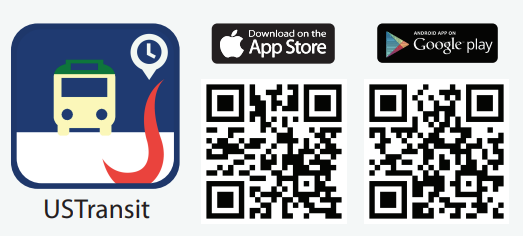

Caption: The image displays the logo of the USTransit app, which is designed to provide users with the estimated time of arrival for buses and minibuses servicing the Hong Kong University of Science and Technology (HKUST). Accompanying the logo are QR codes for downloading the app on both the App Store and Google Play. This initiative is part of a range of services aimed at enhancing the transportation experience for HKUST students, including the newly implemented Tsuen Wan route and a free shuttle service from Hang Hau to HKUST designated for students only.
Time used: 2.1334803104400635


Caption: The image features a simple app icon designed for the USTransit application, which provides users with real-time information about public bus and minibus services. The app, developed by Hong Kong University of Science and Technology (HKUST) alumni, allows users to check the estimated time of arrival for all buses and minibuses serving the HKUST area. This initiative is part of efforts by the Transport Department to enhance public transport services, especially focusing on areas like Hang Hau Public Transport Interchange and Choi Hung.
Time used: 4.317729711532593


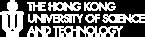

Caption: The image features the logo of The Hong Kong University of Science and Technology (HKUST), prominently displaying the university's name. This logo is contextualized within a document discussing various amenities and services available at HKUST, including restaurants, meatless options, shuttle bus, public transport, accommodations for staff, and nearby facilities like shops. It also indicates copyright ownership, signaling a focus on information about the university's services as of 2025.
Time used: 1.7750427722930908
### Example Document: Underwater SLAM for Marine Robot Navigation _ HKUST CSE.pdf ###


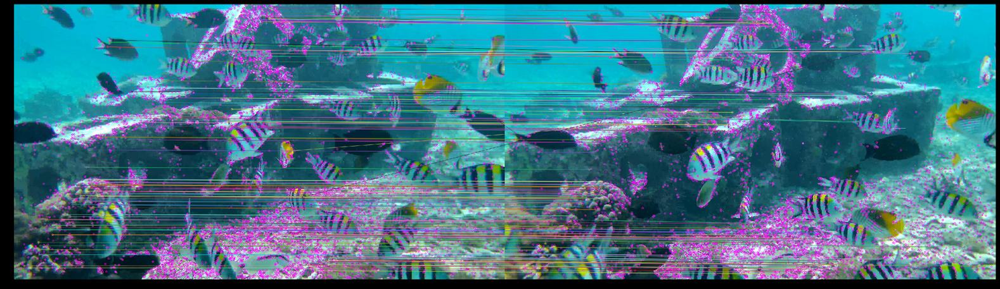

Caption: This image depicts an underwater scene filled with various fish swimming amongst coral and debris. Overlaid on the photo is a series of colored lines and dots, indicating tracking points that are commonly used in Simultaneous Localization and Mapping (SLAM) systems. The visual artifacts illustrate the challenges of maintaining accurate tracking in dynamic underwater environments, underscoring the difficulties faced in developing a robust SLAM system that can perform effectively despite these conditions.
Time used: 5.545273780822754


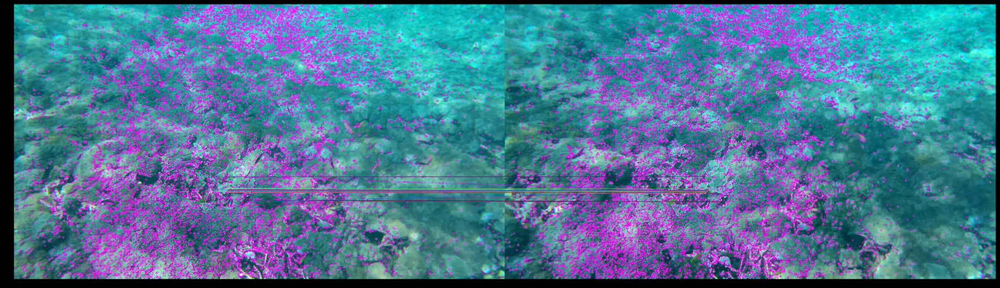

Caption: The image displays two side-by-side views of an underwater scene, highlighting the effects of dynamic light on feature matching in visual processing. The vibrant purple points represent detected features within the area, illustrating how illumination changes can lead to inaccuracies in pose estimation and potential tracking failures in feature-based SLAM systems that utilize ORB features. This visual representation underlines the challenges posed by dynamic lighting in achieving reliable real-time performance in underwater settings.
Time used: 5.23344349861145


In [7]:
import time
from IPython.display import display

docs = [
    "5.1_ Approximating Areas - Mathematics LibreTexts.pdf",
    "Apple Intelligence features are now available in traditional Chinese - Apple (HK).pdf",
    "Transport Arrangement for Fall Term _ Campus Services Office.pdf",
    "Underwater SLAM for Marine Robot Navigation _ HKUST CSE.pdf"
]

llm = LLM()

time_used_list = []

for doc in docs:
    doc_path = "./sample_docs/" + doc
    print(f"### Example Document: {doc} ###")
    images_and_contexts = extract_images_with_context(pdf_path=doc_path, output_image_dir="./sample_docs/extracted_images")

    for image_context in images_and_contexts:
        start = time.time()
        img_path = image_context["image_path"]
        img = PIL.Image.open(img_path)
        display(img)

        user_prompt = f"""You are provided with the following image and context from the source document.

# Context from source document
{image_context["context"]}

Provide a caption for this image as you were instructed.
"""

        image_data = local_image_to_data_url(image_path=img_path)
        
        caption = llm.get_LLM_output(user_prompt=user_prompt, image_data=image_data)

        end = time.time()

        time_used = end - start
        time_used_list.append(time_used)

        print(f"Caption: {caption}")
        print(f"Time used: {time_used}")


In [8]:
import numpy as np

mint = np.min(time_used_list),
maxt = np.max(time_used_list),
meant = np.mean(time_used_list),
vart = np.var(time_used_list)

print(f"Mean: {meant}\nVariance: {vart}\nMax: {maxt}\nMin: {mint}")

Mean: (np.float64(3.886062878370285),)
Variance: 2.9140288294539074
Max: (np.float64(10.124019861221313),)
Min: (np.float64(1.7750427722930908),)
